# Timothy Stevens

## Seller

Owns expensive houses in the center, needs to get rid, best timing within a year, open for renovation when profits rise

## Hypotheses

* Houses sold on spring made more profit, than any other season
* Houses sold after renovation has more profit at autumn or winter
* Renovated houses sold at autumn will make more profit, that non-renovated at spring


## Data cleaning

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import missingno

import json


In [2]:
df_sales = pd.read_pickle('data/houses_sales.pkl')


What is our target houses& They are "expensive houses in the center". 

1. I want to find a center blocks as zip array.
2. I want to find a price range in this 'Kings County'. 
3. I want to be sure, that the more expensive prices are in the 'zip' list I've chosen

This would be nice as geo heat map

In [3]:
df_prices = df_sales[['house_id', 'zipcode',  'lat', 'long', 'yr_built', 'yr_renovated', 'price']]
df_prices[['lat', 'long']].mean()



lat      47.560093
long   -122.213983
dtype: float64

In [ ]:
zipcodes_geojson = 'data/seattle_zip_codes_geo.json'
# zipcodes_geojson = 'data/wa_washington_zip_codes_geo.min.json'

zipcodes = {}
with open(zipcodes_geojson) as zips:
    zipcodes = json.load(zips)


In [68]:
df_median_prices = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    median_price = ('price', 'median')
).reset_index()

df_median_prices.head()
df = df_median_prices.sort_values('median_price', ascending=False).head(6)


df['zipcode'].to_list()

[98039, 98004, 98040, 98112, 98005, 98006]

In [64]:
prices_range = (df_median_prices.median_price.min(), df_median_prices.median_price.max())

fig = px.choropleth_map(
    data_frame = df_median_prices,
    geojson = zipcodes,
    locations = 'zipcode',
    color = 'median_price',
    range_color = prices_range,
    featureidkey="properties.ZCTA5CE10",
    labels={ 'median_price' : "Price, $" },
    title='Median House Prices by zip codes',
    width = 700,
    height = 600,
    zoom = 8.1,
    center = { 'lat': 47.35, 'lon': -122 }
)
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    autosize=False,
    margin={
        'r' : 0,
        't' : 40,
        'l' : 0,
        'b' : 0,
        'pad': 4,
        'autoexpand': True
    }
)
fig.show()

In [ ]:
fig = px.choropleth(
    data_frame = df_prices,
    geojson = zipcodes,
    locations = 'zipcode',
    color = 'price',
    range_color = prices_range,
    featureidkey="properties.ZCTA5CE10",
    labels={ 'price' : "Price, $" },
    title='Maximal House Prices by zip codes',
    width = 700,
    height = 600,
    projection="mercator",
    center = { 'lat': 47.35, 'lon': -122 }
)
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    margin={
        'r' : 0,
        't' : 40,
        'l' : 0,
        'b' : 30,
        'pad': 4,
        'autoexpand': True
    }
)
fig.show()

# who is more expensive?



<Axes: xlabel='zipcode', ylabel='value'>

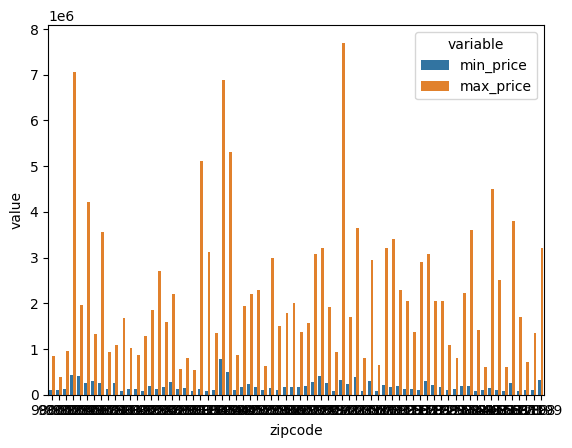

In [73]:
df_sorted_prices = df_prices[['zipcode', 'price']].copy()

df = df_sorted_prices.groupby('zipcode').agg(
    min_price = ('price', 'min'),
    max_price = ('price', 'max'),
    median_price = ('price', 'median')
).reset_index()

df_melted = pd.melt(
    df,
    id_vars = 'zipcode',
    value_vars = ['min_price', 'max_price']
)

sns.barplot(
    data = df_melted,
    x = "zipcode",
    y = "value",
    hue = 'variable'
)


In [74]:

sns.boxplot(
    data = df,
    x = 'zipcode',
    y = 'price',
    order = medians.index
)

ValueError: Could not interpret value `price` for `y`. An entry with this name does not appear in `data`.

In [ ]:
target_zipcodes = medians.reset_index()['zipcode'].head(6).to_list()


In [ ]:
df_highlighted_zip = medians.copy().reset_index()
df_highlighted_zip['selected'] = df_highlighted_zip['zipcode'].apply(
    lambda x: x in target_zipcodes
)


fig = px.choropleth(
    df_highlighted_zip,
    geojson = zipcodes,
    locations = 'zipcode',
    featureidkey="properties.ZCTA5CE10",
    color='selected',
    color_discrete_map={
        'True': 'red',
        'False': 'blue',
    },
    width = 700,
    height = 600,
    projection="mercator",
    title='The areas selected to analysis',
    center = { 'lat': 47.35, 'lon': -122 }
)
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    margin={
        'r' : 0,
        't' : 40,
        'l' : 0,
        'b' : 30,
        'pad': 4,
        'autoexpand': True
    }
)
fig.show()
